In [1]:
from moviepy.editor import *

file_name = "../meetings/meeting_1.mp4"
audio_file = "../audio/meeting1.wav"

# converting video file to audio file
videoClip = VideoFileClip(file_name)
audioClip = videoClip.audio

# saving the audio file to disk
audioClip.write_audiofile(audio_file)

audioClip.close()
videoClip.close()

MoviePy - Writing audio in ../audio/meeting1.wav


MoviePy - Done.


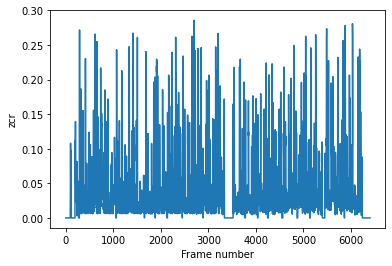

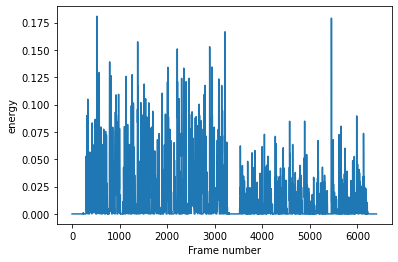

In [2]:
from pyAudioAnalysis.audioBasicIO import read_audio_file, stereo_to_mono
from pyAudioAnalysis.ShortTermFeatures import feature_extraction
import matplotlib.pyplot as plt

audio_file = "../audio/meeting1.wav"

# reading the audio file
[Fs, x] = read_audio_file(audio_file)
x = stereo_to_mono(x)

# analyzing the zcr and the energy characteristics
F, f_names = feature_extraction(x, Fs, 0.050 * Fs, 0.025 * Fs)
plt.plot(F[0,:])
plt.xlabel('Frame number')
plt.ylabel(f_names[0])
plt.show()

plt.plot(F[1,:])
plt.xlabel('Frame number')
plt.ylabel(f_names[1])

plt.show()

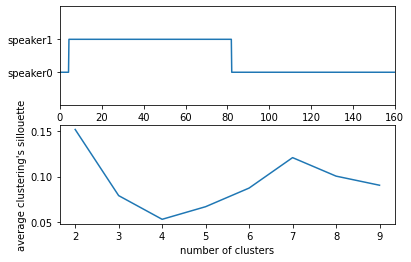

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

In [3]:
from pyAudioAnalysis.audioSegmentation import speaker_diarization

audio_file = "../audio/meeting1.wav"

# segmenting audio with the module built-in method diarization
speaker_diarization(audio_file, 0, lda_dim=0, plot_res=True)

In [4]:
import os, sklearn.cluster
from pyAudioAnalysis.MidTermFeatures import mid_feature_extraction as mT
from pyAudioAnalysis.audioBasicIO import read_audio_file, stereo_to_mono
from pyAudioAnalysis.audioSegmentation import labels_to_segments
from pyAudioAnalysis.audioTrainTest import normalize_features
import numpy as np
import scipy.io.wavfile as wavfile
import IPython

number_of_speakers = 2

# read audio file and calculate the normalized segment feature:
audio_file = "../audio/meeting1.wav"
fs, x = read_audio_file(audio_file)
x = stereo_to_mono(x)
mt_size, mt_step, st_win = 5, 0.5, 0.1
[mt_feats, st_feats, _] = mT(x, fs, mt_size * fs, mt_step * fs,
                            round(fs * st_win), round(fs * st_win * 0.5))
(mt_feats_norm, MEAN, STD) = normalize_features([mt_feats.T])
mt_feats_norm = mt_feats_norm[0].T

# clustering using k-means
n_clusters = number_of_speakers
x_clusters = [np.zeros((fs, )) for i in range(n_clusters)]
k_means = sklearn.cluster.KMeans(n_clusters=n_clusters)
k_means.fit(mt_feats_norm.T)
cls = k_means.labels_

# saving each cluster into different audio files
speakers_duration = []

segs, c = labels_to_segments(cls, mt_step)
for sp in range(n_clusters):                
    count_cl = 0
    for i in range(len(c)):
        if c[i] == sp and segs[i, 1]-segs[i, 0] > 2:
            count_cl += 1
            
            cur_x = x[int(segs[i, 0] * fs): int(segs[i, 1] * fs)]
            x_clusters[sp] = np.append(x_clusters[sp], cur_x)
            x_clusters[sp] = np.append(x_clusters[sp], np.zeros((fs,)))
    
    print(f'cluster {sp}: {count_cl} segments {len(x_clusters[sp])/float(fs)} sec total dur')     
    wavfile.write(f'cluster_{sp}.wav', fs, np.int16(x_clusters[sp]))
    IPython.display.display(IPython.display.Audio(f'cluster_{sp}.wav'))
    speakers_duration.append(len(x_clusters[sp])/float(fs))

# calculating score for meeting
total = 0
for speaker in speakers_duration:
    total += speaker

average = total / len(speakers_duration)

if(average >= 60):
    print('Score of meeting is 100%')
else:
    score = average * 100 / 60
    print('Score of meeting is ' + str(score) + '%')

cluster 0: 1 segments 70.5 sec total dur


cluster 1: 2 segments 94.0 sec total dur


Score of meeting is 100%


In [5]:
import speech_recognition as sr
from pydub import AudioSegment
from pydub.silence import split_on_silence

# initializing speech recognition module
recognizer = sr.Recognizer()

# dividing audio file into chunks
def load_chunks(filename):
    long_audio = AudioSegment.from_wav(filename)
    audio_chunks = split_on_silence(
        long_audio, min_silence_len=800,
        silence_thresh=long_audio.dBFS-14
    )
    return audio_chunks

# converting speech to text
for n in range(2):
    print("----------Speech-to-text for speaker "+ str(n+1) +"-------")
    for audio_chunk in load_chunks('./cluster_' + str(n) +'.wav'):
        audio_chunk.export("./temp", format="wav")
        with sr.AudioFile("./temp") as source:
            audio = recognizer.listen(source)
            try:
                text = recognizer.recognize_google(audio)
                print(text)
            except Exception as ex:
                print(ex)

----------Speech-to-text for speaker 1-------
the last meeting I was working on creating the back-end database to store deposit information
I have created API to register a new user by providing personal information such as name email and password
I created a second
and the last APA was being created to reset password of the user if they lose or forget their existing credential
until the next meeting I'm planning to model database for products and alcohol
create first database to list all product information to the name size and the price of
the second database with information of total stock for particular product at a given time
7
at first I can't I can't find any service provider for database what type of
I was needed to do some research and try out several Alternatives and finally on one provider
----------Speech-to-text for speaker 2-------
things the last meeting I was working on the front end design for the mobile application I have created the login page for user
Allison the si

In [6]:
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk import pos_tag

report = open("./report.txt", "a")

def calculate_tense(sentence):
    words = word_tokenize(sentence)
    tagged = pos_tag(words)

    tense = {}
    tense["future"] = len([word for word in tagged if word[1] == "MD"])
    tense["present"] = len([word for word in tagged if word[1] in ["VBP", "VBZ","VBG"]])
    tense["past"] = len([word for word in tagged if word[1] in ["VBD", "VBN"]]) 
    return(tense)

for n in range(2):
    file = open("../transcript/speaker_" + str(n+1) + ".txt", "r")
    text = file.read()
    file.close()

    # dividing text into sentences
    sentences = sent_tokenize(text)

    things_done = []
    things_will_be_done = []
    issue = []

    # words related to issue reported
    negative_words = ['issue', 'issues', 'error', 'errors', 'problem', 'problems']

    for sentence in sentences:
        tense = calculate_tense(sentence)
    
        if(tense['past'] >= tense['future']):
            is_issue = False
            bag_of_words = word_tokenize(sentence)
        
            for word in negative_words:
                if word in bag_of_words:
                    is_issue = True

            if is_issue:
                issue.append(sentence)
            else:
                things_done.append(sentence)
        else:
            things_will_be_done.append(sentence)

    report.write("Report for speaker " + str(n + 1) + "\n\n")
    
    report.write("* Work done until now *\n")
    for work in things_done:
        report.write("-> " + work + "\n")
    
    report.write("\n* Work will be done *\n")
    for work in things_will_be_done:
        report.write("-> " + work + "\n")
    
    report.write("\n* Issues encountered *\n")
    for work in issue:
        report.write("-> " + work + "\n")
    
    report.write("\n\n")
    
report.close()